# Multi-filter-response-32f3d 

MODEL: unit-wnet-wrferaext18-32f-mean0-ose-trainer-3resblks-3ds-bse2-drop2-dr3-ssim-simenc2 gen_00725001.pt




In [3012]:
#correlation_matrix = np.load('/glade/scratch/dkorytin/correlation_matrix_erasgp_4ds.npy')
#correlation_matrix = np.load('/glade/work/dkorytin/correlation_matrix_era_16f_4ds_jepa2.npy')

correlation_matrix = np.load('/glade/work/dkorytin/correlation_matrix_era_32f_3ds.npy')
activations_vector = np.load('/glade/work/dkorytin/activations_vector_era_32f_3ds.npy')


#correlation_matrix = np.load('/glade/work/dkorytin/correlation_matrix_era_16f_4ds_jepa2.npy')
#activations_vector = np.load('/glade/work/dkorytin/activations_vector_era_16f_4ds_jepa2.npy')

correlation_matrix.shape, activations_vector.shape


((256, 256), (256,))

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:29: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix


[ 0  1  2  3  4  0  5  6  7  8  9 10 11 12  3 13 14 10 15 10  3 16 17 10
 13 18 19 20 20 18 18 18 21 19  8 22  0 11  9 23 24 25 26 27 28 23 29 30
 29 26 11 13 31 29 32  1 23 13 20 33  0 17 16 34 20  3  3  5 35 34 29 23
 13 20 16  1 29 25  4 31  6 24 21 15 28 18 33 36 24  5 31  9 29 15 28  0
 10 37 37 27 13 11 19 38 31 13  7 10 27  4 19 15 33 37 22 11 35  8 39 35
 25  2 26 40 41 17 35 16  4 23 11 33 15 35  5 19  8 38 23 29 10  6 37 28
 39 23 42  1 38 30 11  9 29 32 23 10 31 33 34 32 19  4 43 24 30 28 10 41
 30  5 12  1  3 20 24 11  9 30 36 18 21 35 24  7 15 16 20 18 19 27  0 35
 11 19 19 34 10 25  8 44 15 37  5 42 18 14 25 44 37 23 19 45 36  0 28 24
  0  5 11 23 40 14 38 41 13  4 40 36 26 27 29 15 16 37 19 23 37 24 31  9
 18  0 22 19  2  5 39 29 10 31 11 42 15 24 18 19]
[ 7  6  1  6  3  9  8  9  5  8  3  8  3  5  3  7 10  6 10  7  6  5  6  7
  6  3  4  6 13  3  9  8 13  3  7 11 10 10  8  5  3  4 13 11  7 11  9 11
  3  9  3  3  5 11  7 13  9  3 11  4  3  6 11 11 10  3  6  6  9 11 13  6
 

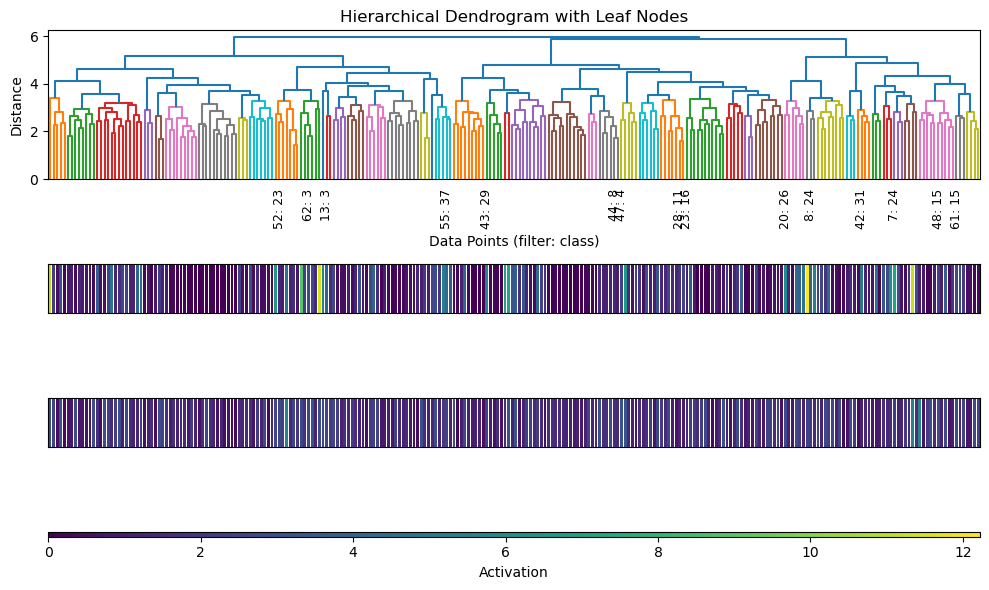

In [3014]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.cluster import hierarchy
import matplotlib.cm as cm

# Load the correlation matrix from a file
# correlation_matrix = load_correlation_matrix_from_file()

# Changeables
height_threshold = 3.4 #3.4 #2 #5.5 #2.4 #2  # Adjust this threshold as needed

# top15 list of leaf IDs
#top15 = [32, 28, 59, 30, 4, 45, 9, 23, 51, 34, 40, 42, 10, 16, 20]
#top15 = [20, 43, 8, 42, 7, 44, 47, 13, 52, 61, 55, 23, 62, 48, 28]   # f32/3ds
#top15 = [39, 3, 42, 32, 15, 20, 62, 35, 46, 24, 11, 14, 57, 16, 8]    # f16/4ds/jepa2
top15 = top15_filters_era

# # Turn off seaborn styling
# import matplotlib
# matplotlib.style.use('default')

###################
# Base dendrogram #
###################
# Calculate the distance matrix from the correlation matrix
distance_matrix = 1 - correlation_matrix

# Perform hierarchical clustering
linkage = hierarchy.linkage(distance_matrix, method='complete')

# Cut the dendrogram at a certain height to obtain clustering labels
# labels = hierarchy.cut_tree(linkage, n_cluster=5, height=height_threshold).flatten()
# labels = hierarchy.cut_tree(linkage, n_clusters=5).flatten()
labels = hierarchy.cut_tree(linkage, height=height_threshold).flatten()
orderred_labels = labels[dendrogram['leaves']] 

# Plot the dendrogram
fig, (ax_dendro, ax_bars, ax_count, ax_colorbar) = plt.subplots(nrows=4, figsize=(10, 6), gridspec_kw={'height_ratios': [3, 1, 1, 0.1]})
dendrogram = hierarchy.dendrogram(linkage, no_labels=False, color_threshold=height_threshold, ax=ax_dendro)

# Set the title, x-label, and y-label for the dendrogram
ax_dendro.set_title('Hierarchical Dendrogram with Leaf Nodes')
ax_dendro.set_xlabel('Data Points')
ax_dendro.set_ylabel('Distance')

# Add leaf IDs to the x-axis labels if they are in the top15 list
xticklabels = ax_dendro.get_xticklabels()
for i, filter in enumerate(dendrogram['leaves']):
    if filter in top15:
        ## without class label
        #xticklabels[i] = f'{filter}'

        # with class label
        class_label = orderred_labels[i]
        xticklabels[i] = f'{filter}: {class_label}'
    else:
        xticklabels[i] = ''

# Set the font size for the tick labels on the x-axis
ax_dendro.set_xticklabels(xticklabels, fontsize=9)



###############
# Activations #
###############
# Plot the leaf nodes with corresponding colors based on activations_vector
leaf_colors = labels[dendrogram['leaves']]
bar_colors = plt.cm.viridis(activations_vector[dendrogram['leaves']] / np.max(activations_vector))  # Normalize colors

# Get the number of leaf nodes
num_leaf_nodes = len(leaf_colors)

# Plot the bar graph with stretched length and color based on activations_vector
ax_bars.bar(range(num_leaf_nodes), np.ones(num_leaf_nodes), color=bar_colors)
ax_bars.set_xlim(-0.5, num_leaf_nodes - 0.5)
ax_bars.set_ylim(bottom=0, top=1.0)
ax_bars.set_xticks([])
ax_bars.set_yticks([])

# Create a color bar
norm = plt.Normalize(0, np.max(activations_vector))
cbar = plt.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=plt.cm.viridis), cax=ax_colorbar, orientation='horizontal')
cbar.set_label('Activation')

# Set the title, x-label, and y-label for the dendrogram
ax_dendro.set_title('Hierarchical Dendrogram with Leaf Nodes')
ax_dendro.set_xlabel('Data Points (filter: class)')
ax_dendro.set_ylabel('Distance')



####################
# Group membership #
####################
# Get unique values and their counts
unique_values, counts = np.unique(labels, return_counts=True)
#expanded_unique_value_counts = [counts[unique_values==label][0] for label in labels]
expanded_unique_value_counts = np.array([np.count_nonzero(labels == label) for label in orderred_labels])
#selected_values = expanded_unique_value_counts[expanded_unique_value_counts > 0]

print(labels)
#print(unique_values)
print(expanded_unique_value_counts, len(expanded_unique_value_counts))


# Calculate the average activations_vector for each class label
average_activations_by_class = np.bincount(orderred_labels, weights=activations_vector[dendrogram['leaves']]) / np.bincount(orderred_labels)

# Create a simple list with elements repeated based on the corresponding label
expanded_average_activations = average_activations_by_class[orderred_labels]

# Prepare selected_values and bar_colors for ax_count
selected_indices = [idx for idx, val in enumerate(labels) if val in expanded_unique_value_counts]
selected_bars = bar_colors[selected_indices]

# Plot the leaf nodes with corresponding colors based on activations_vector
leaf_colors = labels[dendrogram['leaves']]
bar_colors = plt.cm.viridis(expanded_average_activations / np.max(activations_vector))  # Normalize colors


# block out some bars
#selected_indices = [idx for idx, val in enumerate(expanded_unique_value_counts) if val >= 8 and activations_vector[idx]> 2]
selected_indices = [idx for idx, val in enumerate(expanded_average_activations)]
selected_bars = bar_colors[selected_indices*10]

# plot
ax_count.bar(selected_indices, np.ones(len(selected_indices)), color=selected_bars)

#ax_count.set_xlim(ax_bars.get_xlim())  # Match x-limits with ax_bars
ax_count.set_xlim(-0.5, num_leaf_nodes - 0.5)

ax_count.set_ylim(bottom=0, top=1.0)
ax_count.set_xticks([])
ax_count.set_yticks([])
        
plt.tight_layout()
plt.show()


In [3017]:
# Find the class (label) for each leaf node that satisfies the condition
selected_classes = [orderred_labels[ii] for ii in range(len(expanded_average_activations)) if expanded_average_activations[ii] > 3.4]

# Print the results
print("Selected Leaves and their Class:")
orderred_activations = activations_vector[dendrogram['leaves']]
for leaf, class_label, avgact, activation in zip(dendrogram['leaves'], orderred_labels, expanded_average_activations, orderred_activations):
    if class_label in selected_classes:
        print(f"Class {class_label}: Leaf {leaf}: Avg Activation {avgact}: Activation {activation}")


Selected Leaves and their Class:
Class 7: Leaf 249: Avg Activation 5.543084005514781: Activation 4.592717170715332
Class 7: Leaf 103: Avg Activation 5.543084005514781: Activation 11.139156341552734
Class 7: Leaf 70: Avg Activation 5.543084005514781: Activation 0.8973785042762756


In [3033]:
def find_leaves_in_class(dendrogram, class_label):
    # Find all leaves that belong to the specified class
    selected_leaves = [leaf for leaf, label in zip(dendrogram['leaves'], orderred_labels) if label == class_label]

    return selected_leaves

selected_leaves_in_class = find_leaves_in_class(dendrogram, 37) # 16,28, 14
selected_leaves_in_class

[203, 195, 216, 55, 180, 245, 106, 212]

### multi-filter subs


In [2317]:
def calc_filter_variance(input_chunk, bn_mean_era, gen, filters):
    generated_chunk = gen.decode(bn_mean_era).detach().numpy()
    avg_decoded = generated_chunk[0]
    generated_chunk_denorm = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    avg_decoded_denorm = generated_chunk_denorm[0]

    encoded_extreme = gen.encode(input_chunk)[0].detach()
    generated_chunk = gen.decode(encoded_extreme).detach().numpy()
    front_decoded = generated_chunk[0]
    generated_chunk_denorm = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    front_decoded_denorm = generated_chunk_denorm[0]

    newbn = bn_mean_era.clone()

    for ff in filters:
        newbn[0, ff, :, :] = encoded_extreme[0, ff, :, :].clone()

    generated_chunk = gen.decode(newbn).detach().numpy()
    generated_chunk_denorm = generated_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
    generated_chunk_denorm = generated_chunk_denorm[0]

    err = float(mae(torch.tensor(generated_chunk[0]), torch.tensor(front_decoded)).detach())
    err18 = [round_sig(float(mae(torch.tensor(generated_chunk[0][ii]), torch.tensor(front_decoded[ii])).detach())) for ii in range(18)]

    return [err, err18, filters, generated_chunk_denorm - avg_decoded_denorm]

In [2611]:
2

2

In [3028]:
def get_filter_substitutions_minmax(storms, filters, calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b, stormcount, vmax=None, vmin=None):
    vmax = [-9999 for y in range(18)]  
    vmin = [9999 for y in range(18)]           

    for ii in range(stormcount): #range(len(storms)):
        input_chunk = storms[ii:ii+1, :, 58:58+64, 20:20+64]
        input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom

        xx = calc_filter_variance(input_chunk, bn_mean_era, gen_b, filters)

        vmin_temp = [xx[3][ii].mean() - xx[3][ii].std()*2 for ii in range(18)]
        vmax_temp = [xx[3][ii].mean() + xx[3][ii].std()*2 for ii in range(18)]

        vmin = [min(vmin[ii], vmin_temp[ii]) for ii in range(18)]
        vmax = [max(vmax[ii], vmax_temp[ii]) for ii in range(18)]
        
    return vmin, vmax


# def apply_filter_substitutions(storms, filters, calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b, stormcount, vmin=None, vmax=None):
    
#     for ii in range(stormcount): #range(len(storms)):
#         print('\nSTORM INDEX:', ii)
#         input_chunk = storms[ii:ii+1, :, 58:58+64, 20:20+64]
#         input_chunk[np.isnan(input_chunk)] = 0.   # extended surface domain has nan's at bottom

#         xx = calc_filter_variance(input_chunk, bn_mean_era, gen_b, filters)
#         print(np.array(xx[3]).shape)

#         if vmax == None or vmin == None:
#             vmax = [-9999 for y in range(18)]  
#             vmin = [9999 for y in range(18)]           
#             vmin_temp = [xx[3][ii].mean() - xx[3][ii].std()*2 for ii in range(18)]
#             vmax_temp = [xx[3][ii].mean() + xx[3][ii].std()*2 for ii in range(18)]

#             vmin = [min(vmin[ii], vmin_temp[ii]) for ii in range(18)]
#             vmax = [max(vmax[ii], vmax_temp[ii]) for ii in range(18)]

#         print("FILTERS", filters)
#         svars = [0, 1, 2, 3, 4, 5, 6, 7, 8]
#         plot_9v_192x256(xx[3], None, vmin, vmax, svars=svars, xoff=20, yoff=58)
#         svars = [9, 10, 11, 12, 13, 14, 15, 16, 17]
#         plot_9v_192x256(xx[3], None, vmin, vmax, svars=svars, xoff=20, yoff=58)
        
#     return vmin, vmax


def apply_filter_substitutions(storms, filters, calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b, stormcount, vmin=None, vmax=None):
    
    original_ranges_mmx = []  # Store the original ranges for each variable
    original_ranges_std = []
    
    for ii in range(stormcount):
        print('\nSTORM INDEX:', ii)
        input_chunk = storms[ii:ii+1, :, 58:58+64, 20:20+64]
        chunk_mask = mask[58:58+64, 20:20+64]
        input_chunk[np.isnan(input_chunk)] = 0.
        
        expanded_chunk_mask = chunk_mask[np.newaxis, np.newaxis, :, :]
        
        xx = calc_filter_variance(input_chunk, bn_mean_era, gen_b, filters)
        print(np.array(xx[3]).shape)
        
        if vmax is None or vmin is None:
            vmax = [-9999 for _ in range(18)]
            vmin = [9999 for _ in range(18)]
            vmin_temp = [xx[3][ii].mean() - xx[3][ii].std() * 2 for ii in range(18)]
            vmax_temp = [xx[3][ii].mean() + xx[3][ii].std() * 2 for ii in range(18)]
            
            vmin = [min(vmin[ii], vmin_temp[ii]) for ii in range(18)]
            vmax = [max(vmax[ii], vmax_temp[ii]) for ii in range(18)]
        
        # Calculate the original range for each variable (channel)
#         decoded_extreme = gen.decode(encoded_extreme).detach() + mean
#         # denorm
#         decoded_extreme = decoded_extreme * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
#         decoded_extreme = np.array(decoded_extreme)[0]
#         decoded_extreme[np.isnan(decoded_extreme)] = 0.   # extended surface domain has nan's at bottom
#         #raw_era[8:] = (raw_era * mask)[8:]
#         # ^4 prec
#         decoded_extreme[8] = decoded_extreme[8] ** 4

        input_chunk_denorm = input_chunk * (minmaxi_era[:,1]-minmaxi_era[:,0])[np.newaxis,:,np.newaxis,np.newaxis] + minmaxi_era[:,0][np.newaxis,:,np.newaxis,np.newaxis]
        input_chunk_denorm = np.array(input_chunk_denorm)
        input_chunk_denorm[np.isnan(input_chunk_denorm)] = 0.   # extended surface domain has nan's at bottom
        input_chunk_denorm[8:] = (input_chunk_denorm * expanded_chunk_mask)[8:]
        input_chunk_denorm[:, 8] = input_chunk_denorm[:, 8] ** 4
        for var_idx in range(18):
            original_range_mmx = np.max(input_chunk_denorm[:, var_idx, :, :]) - np.min(input_chunk_denorm[:, var_idx, :, :])
            original_range_std = np.std(input_chunk_denorm[:, var_idx, :, :], axis=(-2, -1))
            original_ranges_mmx.append(original_range_mmx)
            original_ranges_std.append(original_range_std)
            
                    
        print("FILTERS", filters)
        svars = [0, 1, 2, 3, 4, 5, 6, 7, 8]
        plot_9v_192x256(xx[3], None, vmin, vmax, svars=svars, xoff=20, yoff=58)
        svars = [9, 10, 11, 12, 13, 14, 15, 16, 17]
        plot_9v_192x256(xx[3], None, vmin, vmax, svars=svars, xoff=20, yoff=58)
        
                   
        # Create a bar plot
        avg_percentage_diffs_mmx = []
        avg_percentage_diffs_std = []

        for var_idx in range(18):
            percentage_diff_mmx = (xx[3][var_idx] / original_ranges_mmx[var_idx]) * 100
            avg_percentage_diff_mmx = np.mean(percentage_diff_mmx).item()
            avg_percentage_diffs_mmx.append(avg_percentage_diff_mmx)

            percentage_diff_std = (xx[3][var_idx] / original_ranges_std[var_idx]) * 100
            avg_percentage_diff_std = np.mean(percentage_diff_std).item()
            avg_percentage_diffs_std.append(avg_percentage_diff_std)

        plt.figure(figsize=(8, 6))  # Adjust the figure size here
        variable_names = [f"Variable {var_idx}" for var_idx in range(18)]
        bar_width = 0.35

        plt.barh(np.arange(len(variable_names)), avg_percentage_diffs_mmx, bar_width, label='Original Ranges (MaxDiff)', color='skyblue')
        plt.barh(np.arange(len(variable_names)) + bar_width, avg_percentage_diffs_std, bar_width, label='Original Ranges (StdDev)', color='orange')

        plt.xlabel('Avg % Difference')
        plt.ylabel('Variable')
        plt.title('Average % Difference for Each Variable')
        plt.yticks(np.arange(len(variable_names)) + bar_width / 2, variable_names)
        plt.legend()
        plt.tight_layout()
        plt.show()

    
    return vmin, vmax

In [3029]:
storms.shape

torch.Size([26, 18, 192, 256])

/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:7: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)
  import sys



STORM INDEX: 0


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:57: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [104, 9, 240, 27, 107, 8, 7, 137, 247]


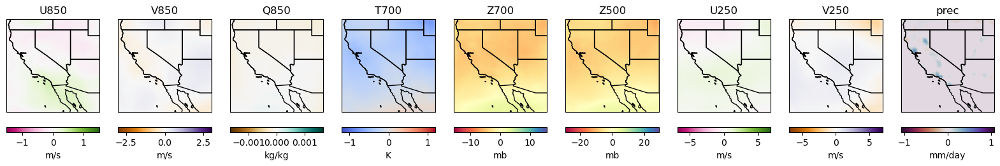

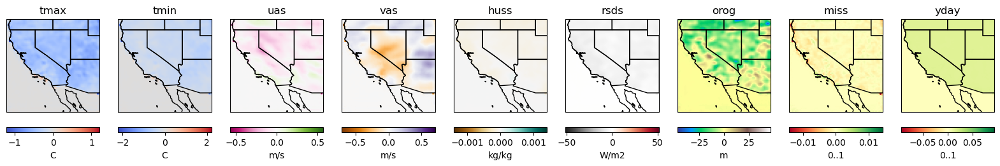

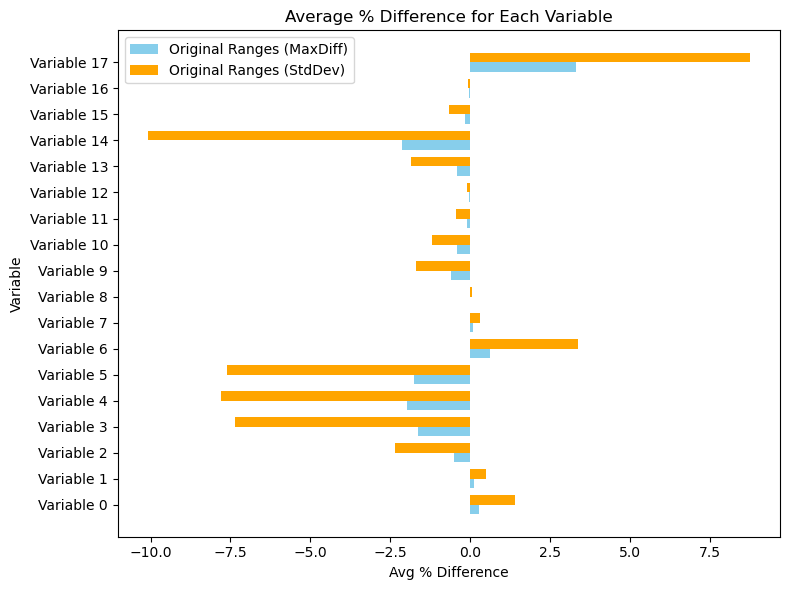


STORM INDEX: 1


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:57: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [104, 9, 240, 27, 107, 8, 7, 137, 247]


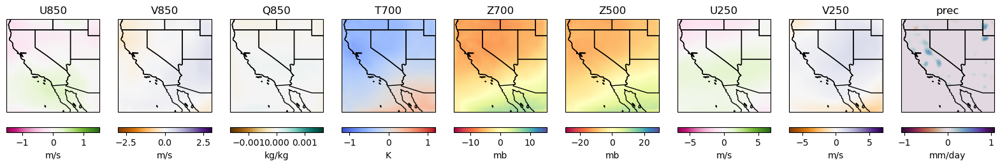

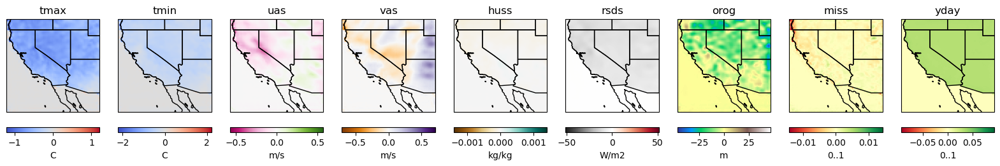

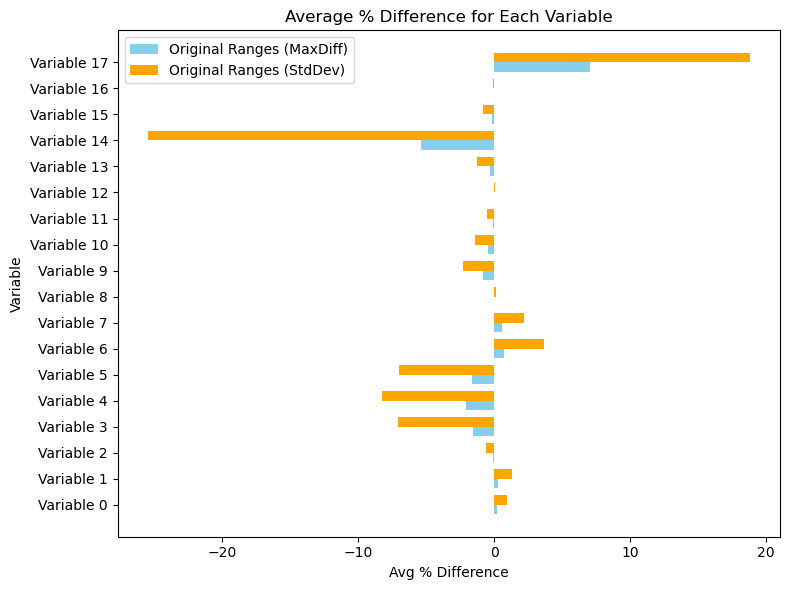


STORM INDEX: 2


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:57: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [104, 9, 240, 27, 107, 8, 7, 137, 247]


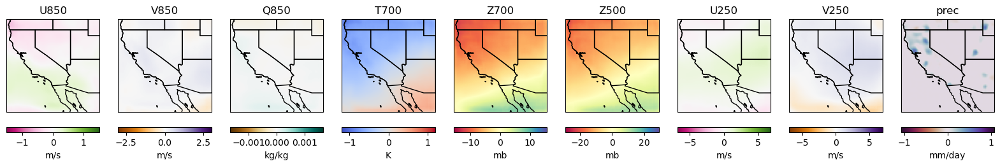

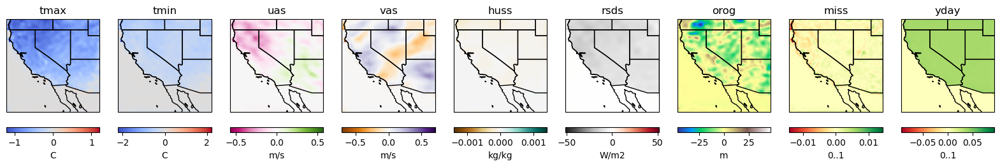

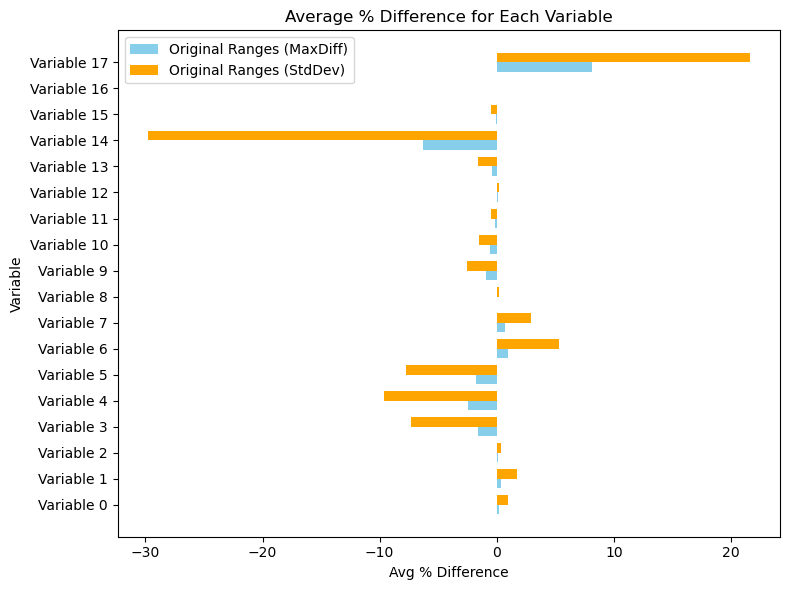


STORM INDEX: 3


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:57: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [104, 9, 240, 27, 107, 8, 7, 137, 247]


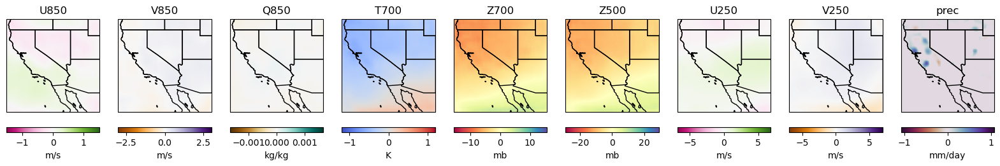

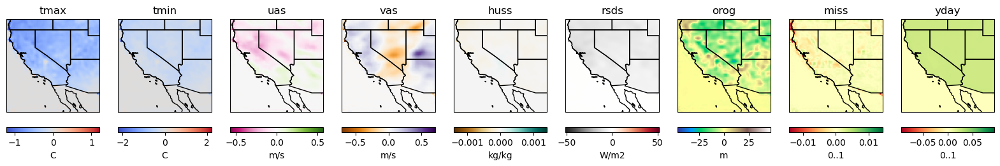

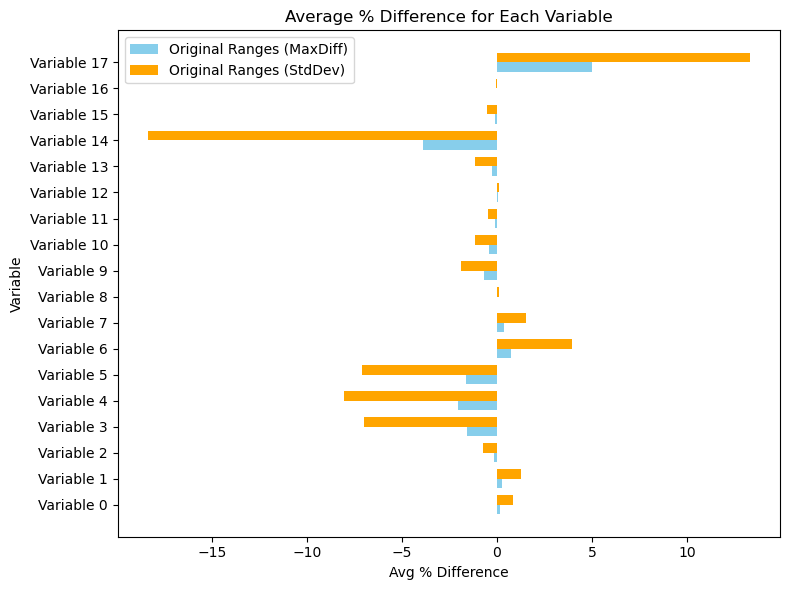


STORM INDEX: 0


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:57: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [41, 79, 62, 13, 233, 125]


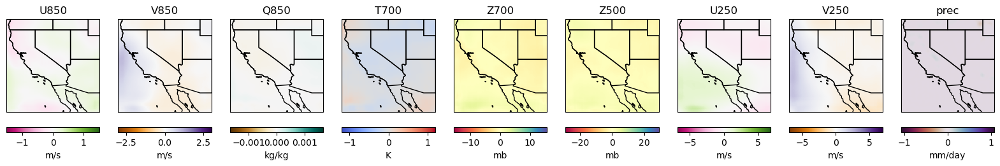

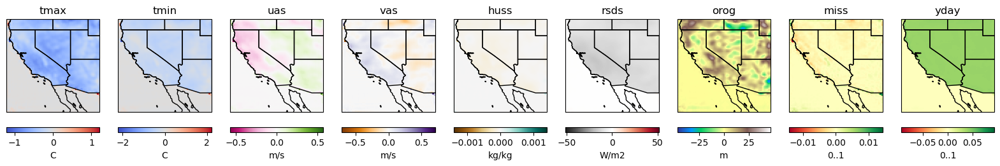

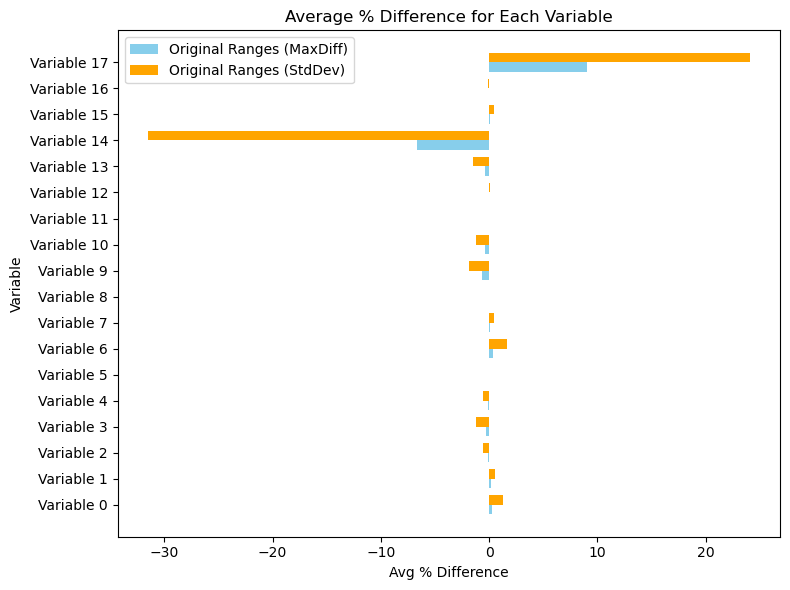


STORM INDEX: 1


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:57: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [41, 79, 62, 13, 233, 125]


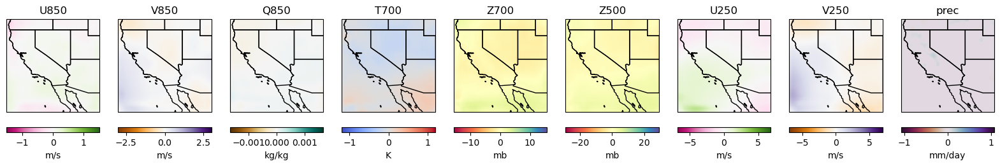

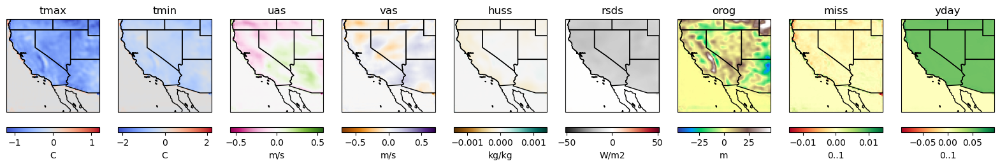

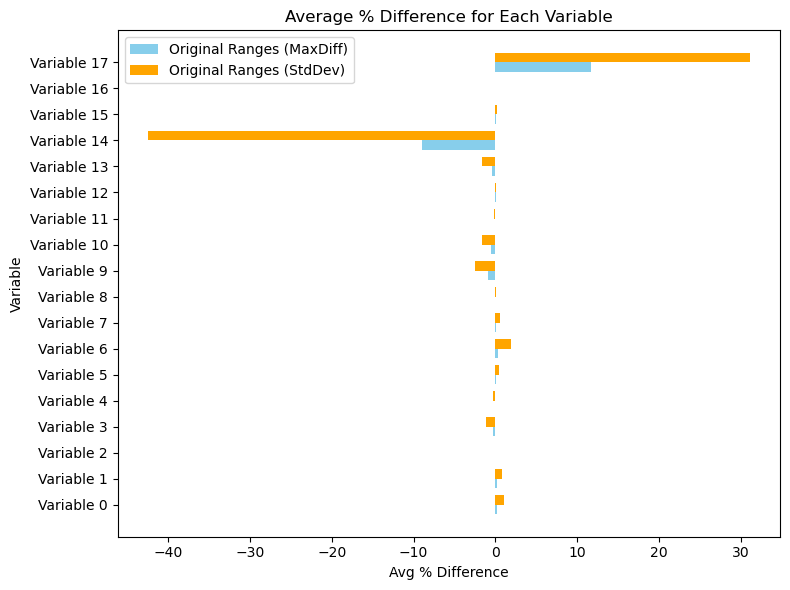


STORM INDEX: 2


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:57: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [41, 79, 62, 13, 233, 125]


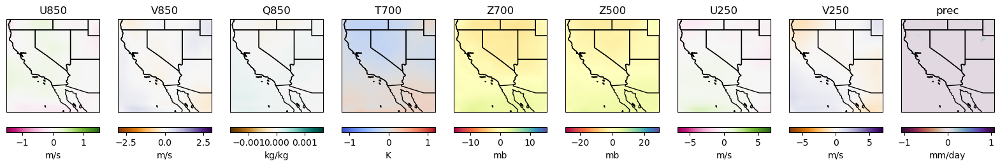

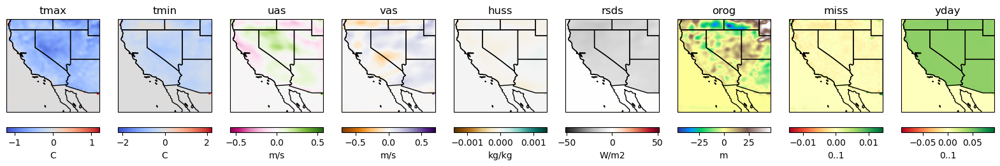

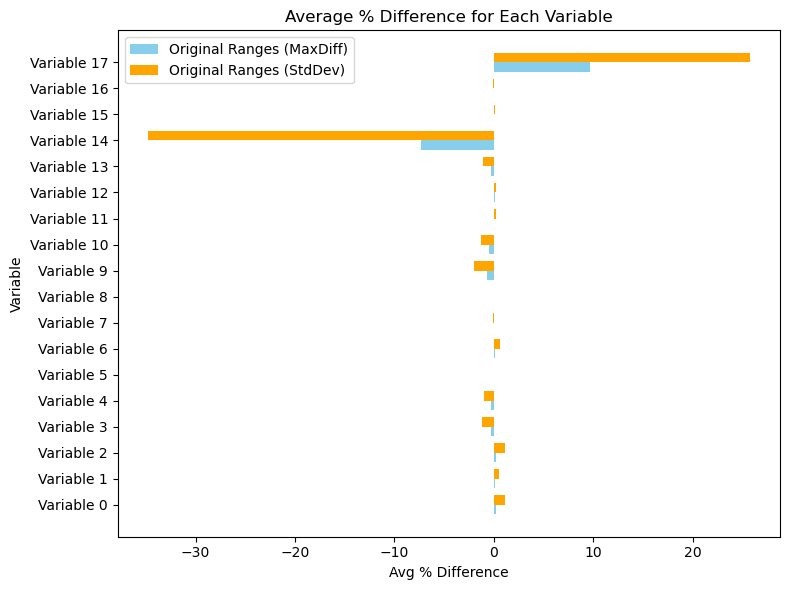


STORM INDEX: 3


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:57: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [41, 79, 62, 13, 233, 125]


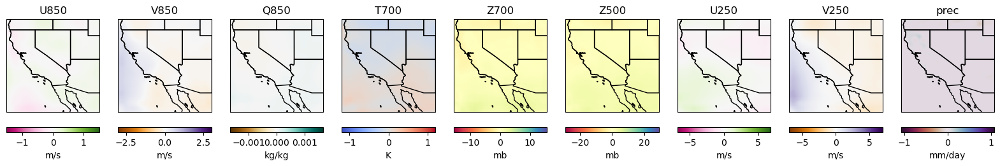

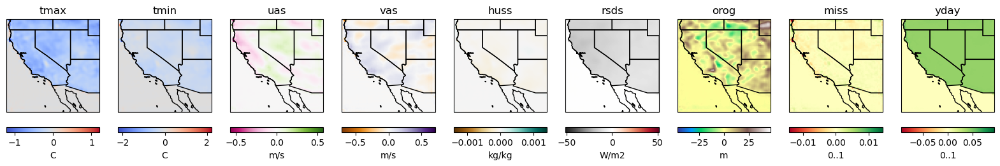

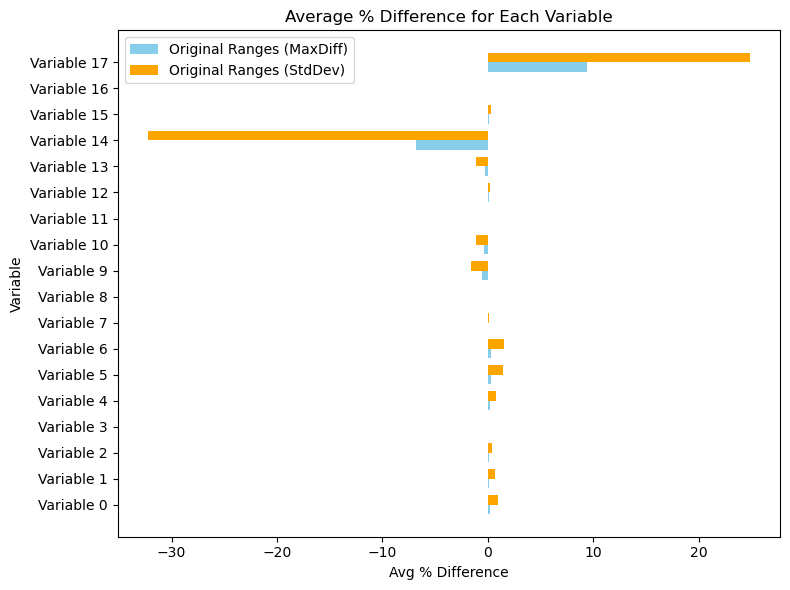


STORM INDEX: 0


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:57: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [15, 146, 74, 165, 153, 53, 48, 230, 61]


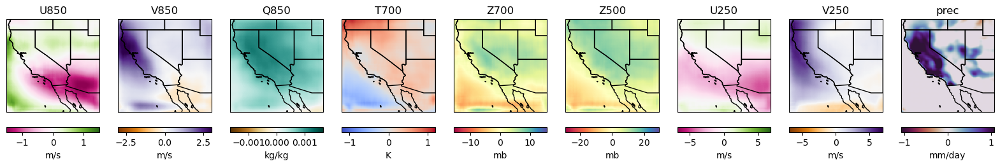

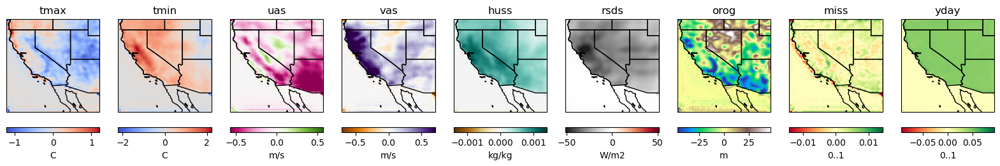

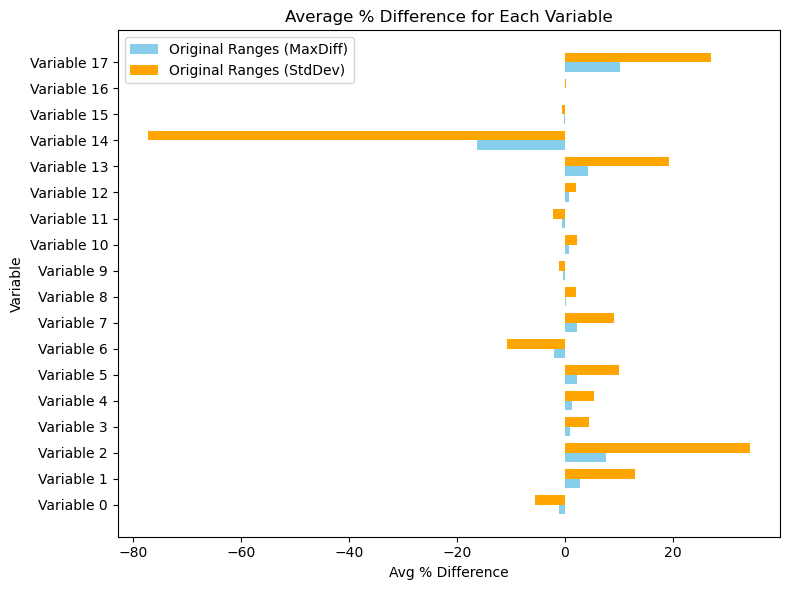


STORM INDEX: 1


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:57: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [15, 146, 74, 165, 153, 53, 48, 230, 61]


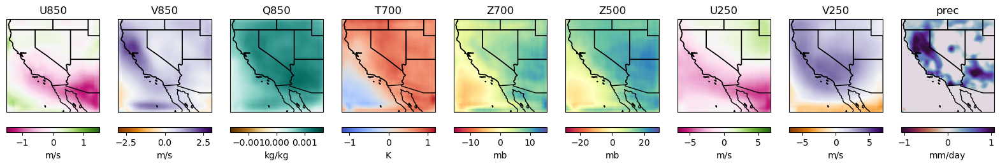

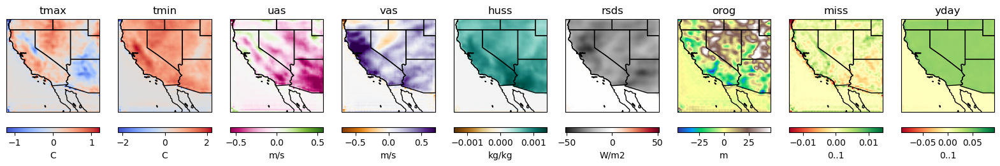

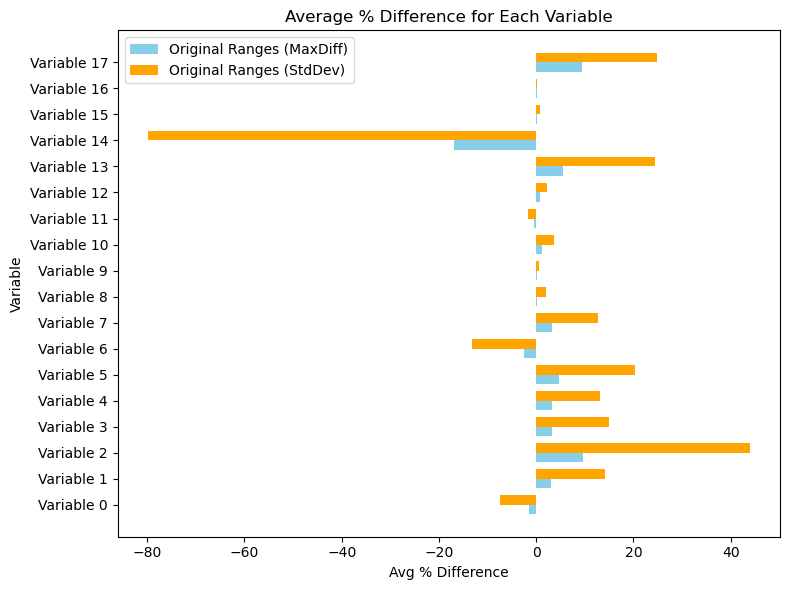


STORM INDEX: 2


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:57: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [15, 146, 74, 165, 153, 53, 48, 230, 61]


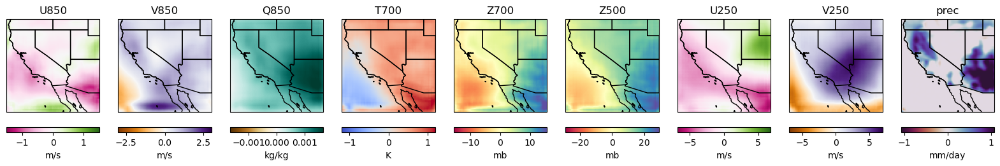

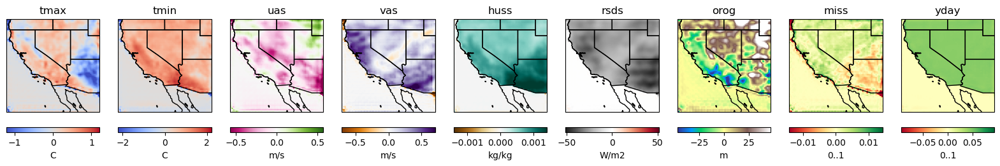

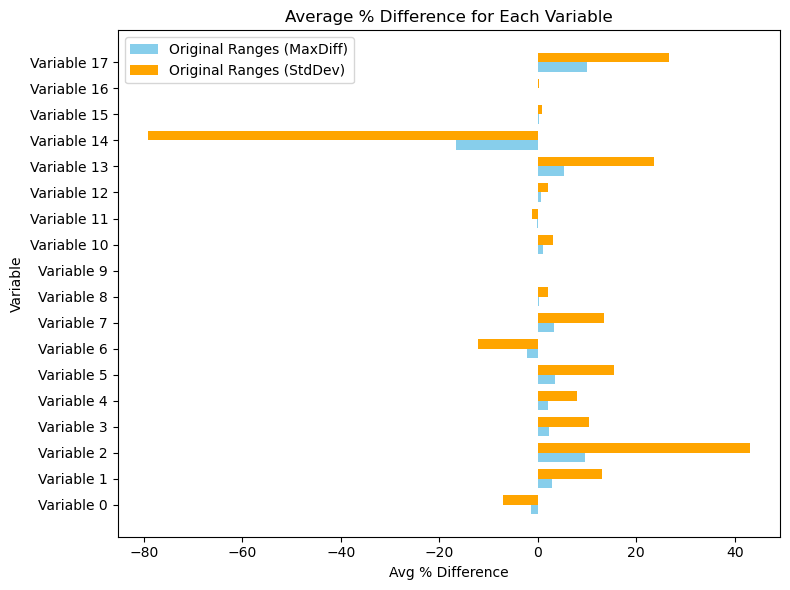


STORM INDEX: 3


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:57: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [15, 146, 74, 165, 153, 53, 48, 230, 61]


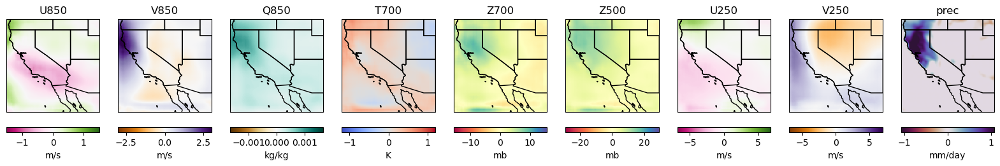

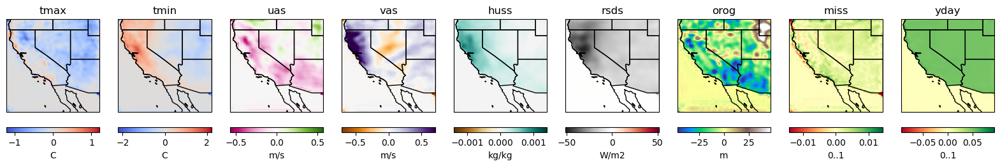

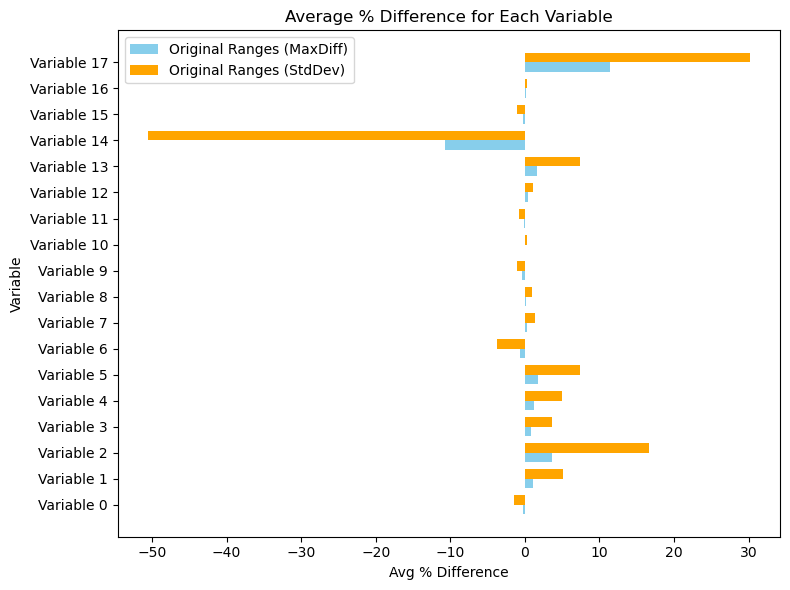


STORM INDEX: 0


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:57: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [203, 195, 216, 55, 180, 245, 106, 212]


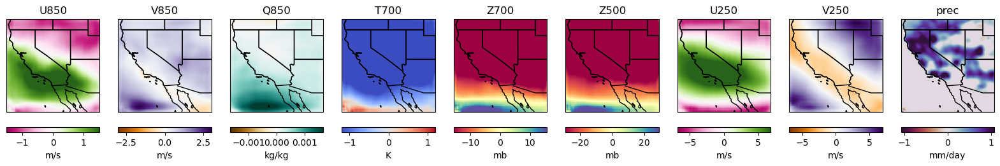

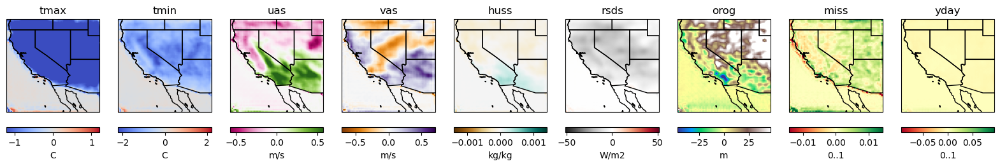

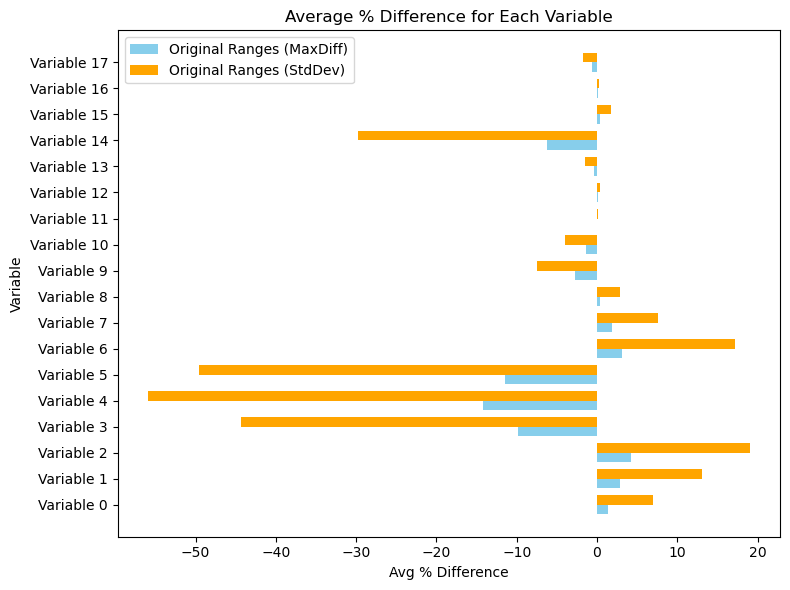


STORM INDEX: 1


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:57: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [203, 195, 216, 55, 180, 245, 106, 212]


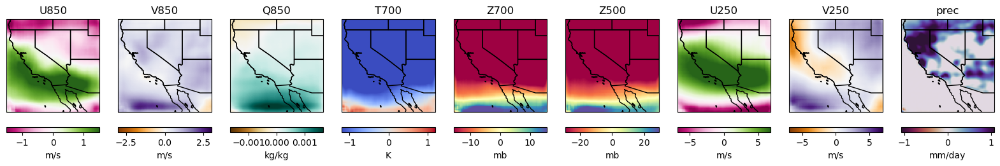

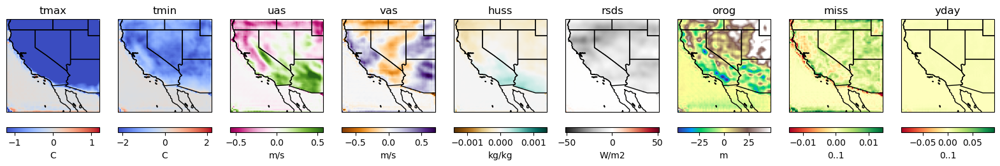

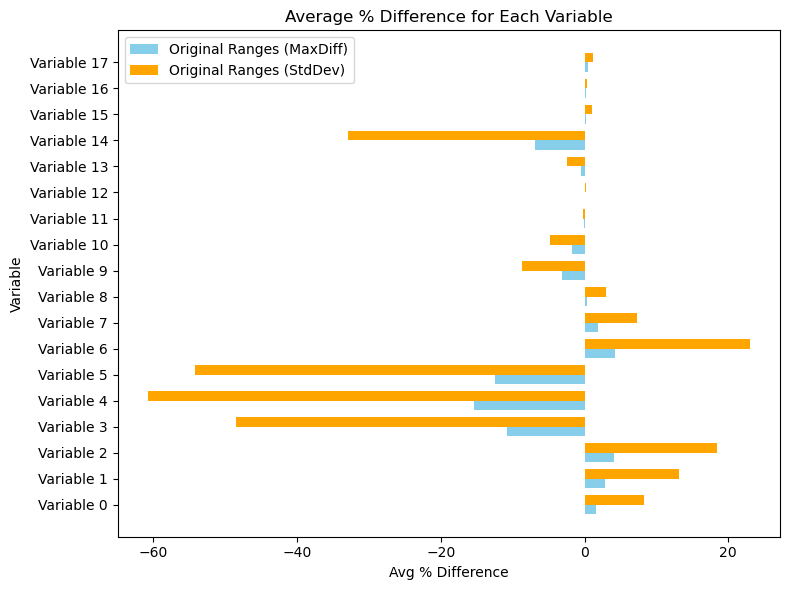


STORM INDEX: 2


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:57: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [203, 195, 216, 55, 180, 245, 106, 212]


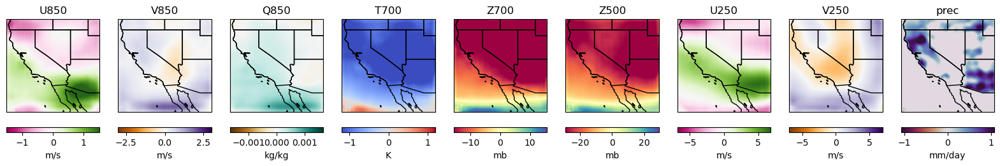

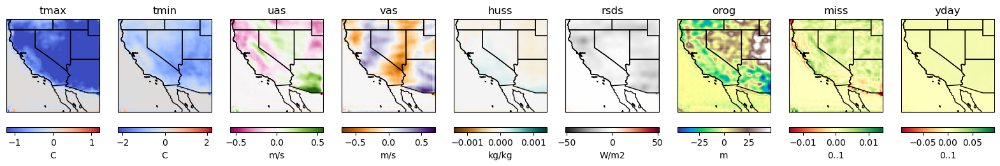

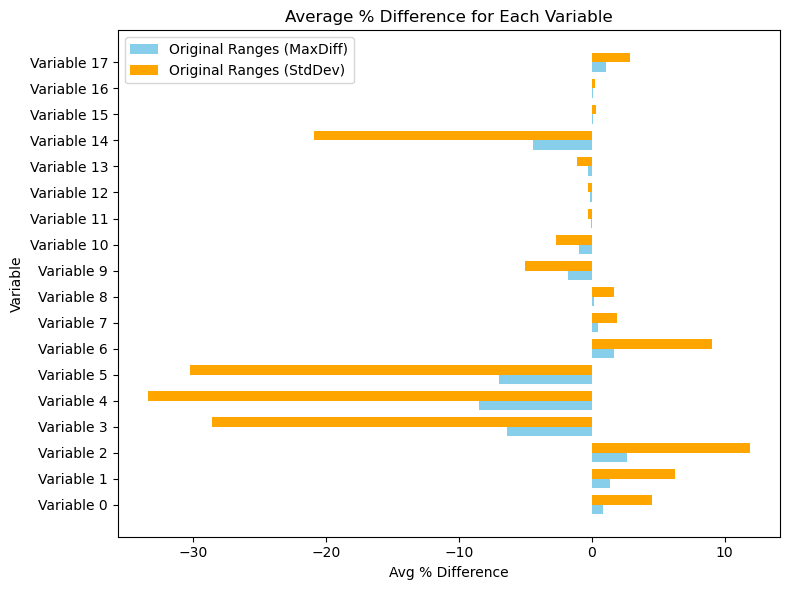


STORM INDEX: 3


/glade/u/home/dkorytin/miniconda3/envs/na-cordex-zarr-jnb/lib/python3.7/site-packages/ipykernel_launcher.py:57: UserWarning: masked_fill_ received a mask with dtype torch.uint8, this behavior is now deprecated,please use a mask with dtype torch.bool instead. (Triggered internally at  /opt/conda/conda-bld/pytorch_1648016052946/work/aten/src/ATen/native/TensorAdvancedIndexing.cpp:1272.)


(18, 64, 64)
FILTERS [203, 195, 216, 55, 180, 245, 106, 212]


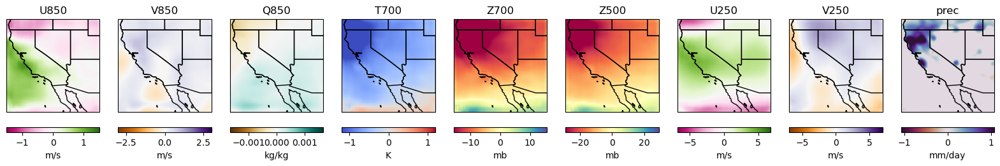

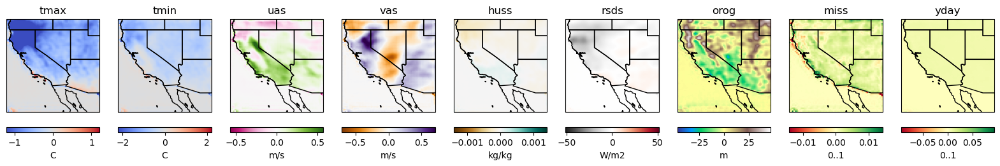

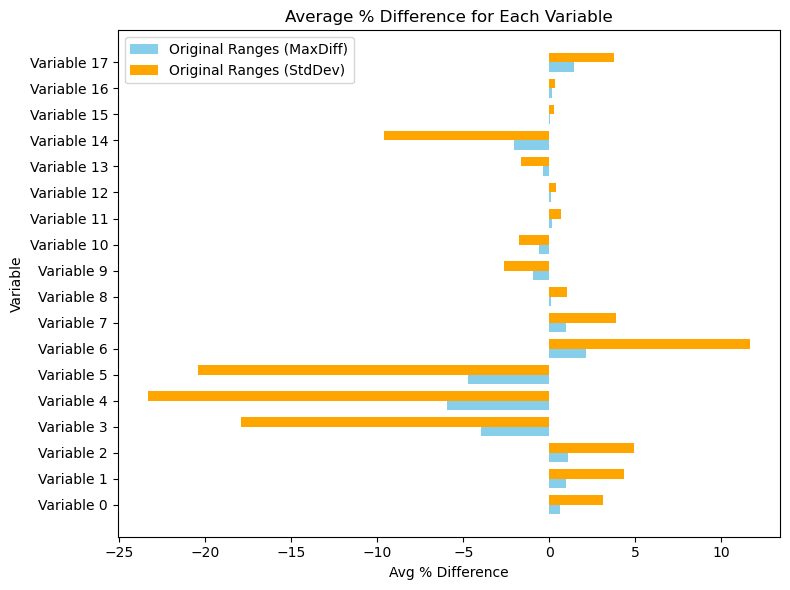

([-1.5266245798517444,
  -1.694824470155907,
  -0.00024374672899941387,
  -0.8372610837979957,
  -11.48545670664824,
  -15.885560488222076,
  -6.814256802514027,
  -4.112591276313777,
  -0.57423429140318,
  -1.2116914891070327,
  -0.9655416717060056,
  -0.5714691277510944,
  -0.3668833213717946,
  -0.0004392544444978662,
  -51.36274287455447,
  -42.99117840220993,
  -0.013201422049150376,
  -0.020717411706322776],
 [1.1204479351528245,
  3.0010017848967934,
  0.0016594519006019972,
  1.1978014475442649,
  15.68303561493751,
  29.12177218607889,
  5.445035992079094,
  6.909104350386219,
  1.072196944250032,
  1.0060603033634774,
  2.210265676180772,
  0.3542371906828572,
  0.7070061398504414,
  0.0014036408059581815,
  15.78980775534642,
  46.92956852307909,
  0.014202521338079928,
  0.09435885456724077])

In [3036]:
#apply_filter_substitutions(storms, [0, 1, 2], calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b)
vmin,vmax = get_filter_substitutions_minmax(storms, [15, 146, 74, 165, 153, 53, 48, 230, 61], calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b, 26)
apply_filter_substitutions(storms, [104, 9, 240, 27, 107, 8, 7, 137, 247], calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b, 4, vmin=vmin, vmax=vmax)
apply_filter_substitutions(storms, [41, 79, 62, 13, 233, 125], calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b, 4, vmin=vmin, vmax=vmax)
apply_filter_substitutions(storms, [15, 146, 74, 165, 153, 53, 48, 230, 61], calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b, 4, vmin=vmin, vmax=vmax)
apply_filter_substitutions(storms, [203, 195, 216, 55, 180, 245, 106, 212], calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b, 4, vmin=vmin, vmax=vmax)



#apply_filter_substitutions(storms, [111, 7, 81, 94, 241, 39, 141, 100, 29, 12, 125, 70, 162, 222, 240, 183, 185, 231, 236, 87, 47, 119, 48, 82, 107, 101, 113, 74, 91, 23, 128, 126, 173, 202, 220, 36, 57, 242, 83, 175, 127, 164, 146, 234, 33, 174, 195, 212, 15, 21, 201, 215, 79, 157, 177, 11, 142, 85, 88, 253, 32, 151, 192, 92, 136, 77, 40, 67, 147, 163, 114, 211, 102, 224]
#, calc_filter_variance, plot_9v_192x256, bn_mean_era, gen_b)
